<a href="https://colab.research.google.com/github/kaayaanil/pytorch_examples/blob/main/Transfer_Learning_Pytorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Transfer Learning

### Get Important Libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from torch.utils.data import Dataset,DataLoader
from torch import nn
from torchvision.transforms import ToTensor,Lambda
from torchvision import datasets
import torchvision
import PIL
import warnings
import glob
import os
warnings.filterwarnings("ignore")

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

### Get Data

In [3]:
weights = torchvision.models.EfficientNet_V2_S_Weights.DEFAULT
auto_transforms = weights.transforms()
auto_transforms

ImageClassification(
    crop_size=[384]
    resize_size=[384]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

In [4]:
# Download the Caltech101 dataset
data = datasets.Caltech101(root='data', download=True,transform=auto_transforms)

131740031it [00:00, 188358878.37it/s]


Extracting data/caltech101/101_ObjectCategories.tar.gz to data/caltech101


14028800it [00:00, 168805535.58it/s]


Extracting data/caltech101/Annotations.tar to data/caltech101


In [5]:
def is_rgb_image(image_file):
    with PIL.Image.open(image_file) as img:
        if img.mode == "RGB":
            return True
        else:
            return False

def replace_with_rgb_image(image_file):
    # Delete the old non-RGB image
    with PIL.Image.open(image_file) as img:
        if img.mode != "RGB":
            rgb_img = img.convert("RGB")

            os.remove(image_file)
            rgb_img.save(image_file)

In [6]:
for category_dir in glob.glob(os.path.join('data/caltech101/101_ObjectCategories', "*")):
    category_name = os.path.basename(category_dir)
    for image_file in glob.glob(os.path.join(category_dir, "*.jpg")):
      if not is_rgb_image(image_file):
        replace_with_rgb_image(image_file)

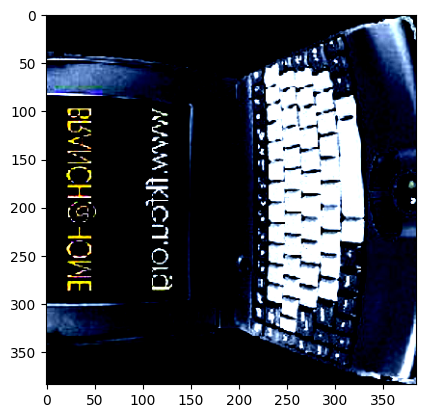

Cateogry of image: laptop


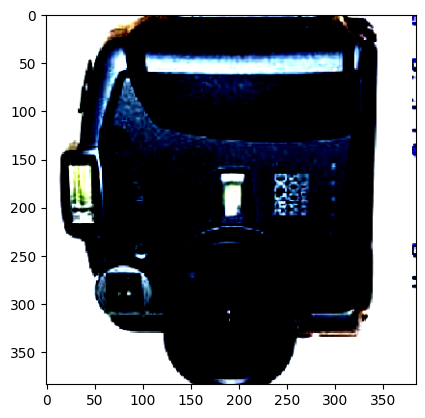

Cateogry of image: camera


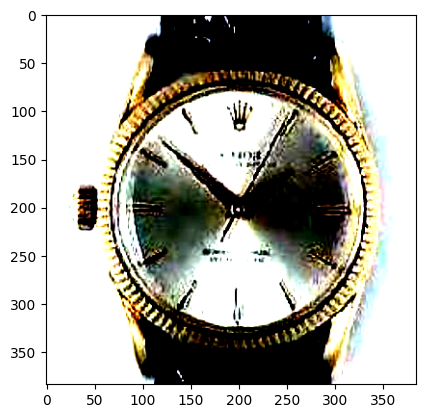

Cateogry of image: watch


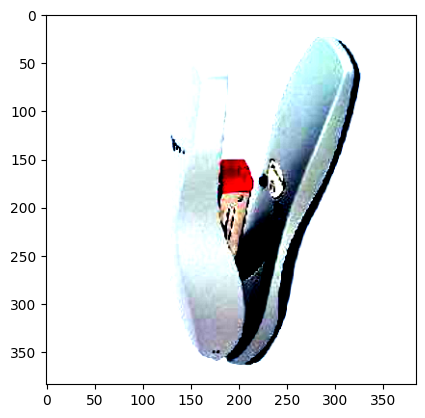

Cateogry of image: stapler


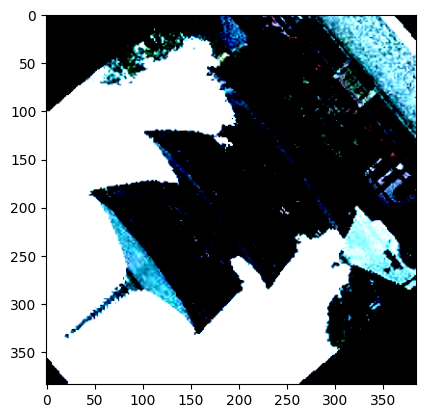

Cateogry of image: pagoda


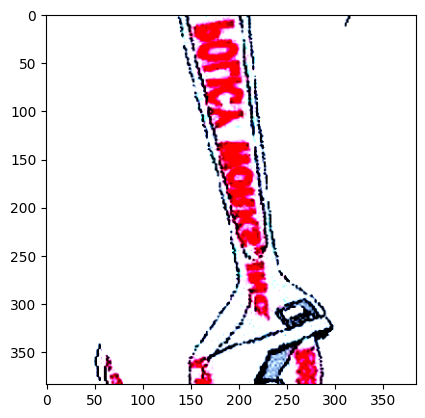

Cateogry of image: wrench


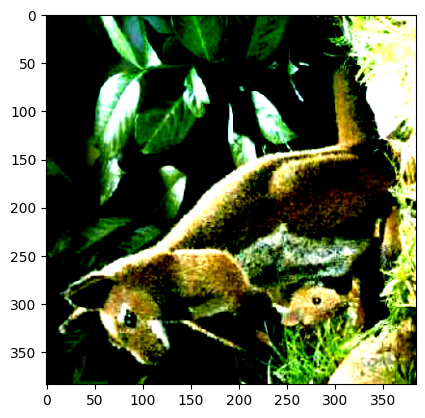

Cateogry of image: kangaroo


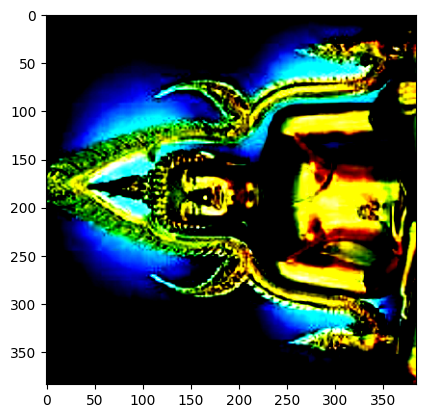

Cateogry of image: buddha


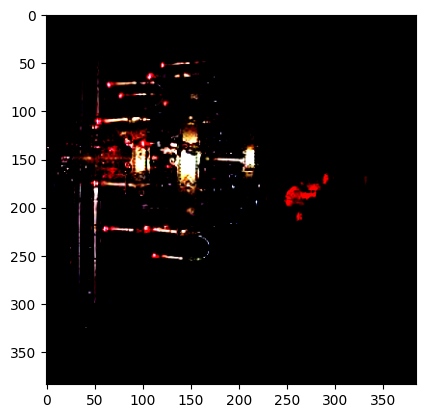

Cateogry of image: chandelier


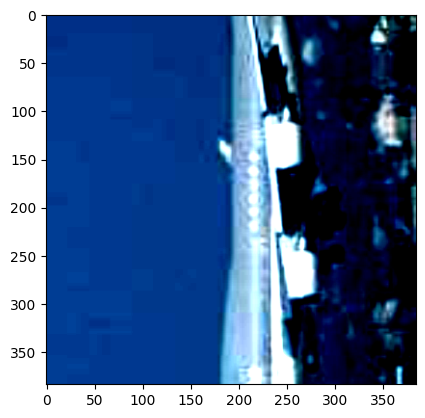

Cateogry of image: airplanes


In [7]:
caltech_cats = data.categories

for i in torch.randint(len(data),size = (1,10))[0]:
  plt.imshow(np.array(data[i.item()][0]).T)
  plt.show()
  print(f'Cateogry of image: {caltech_cats[data[i.item()][1]]}')

In [8]:
print("Looks, great!")

Looks, great!


In [9]:
generator1 = torch.Generator().manual_seed(42)
train_dataset, test_dataset = torch.utils.data.random_split(data, lengths=[0.7,0.3])

In [10]:
train_dataloader = DataLoader(train_dataset,batch_size=32,shuffle=True)
test_dataloader = DataLoader(test_dataset,batch_size=32,shuffle=True)


### Get Model

In [11]:
weights = torchvision.models.EfficientNet_V2_S_Weights.DEFAULT

In [12]:
model = torchvision.models.efficientnet_v2_s(weights=weights).to(device)

Downloading: "https://download.pytorch.org/models/efficientnet_v2_s-dd5fe13b.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_s-dd5fe13b.pth
100%|██████████| 82.7M/82.7M [00:01<00:00, 49.4MB/s]


In [13]:
!pip install torchinfo
from torchinfo import summary

In [14]:
summary(model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 1000]           --                   True
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   True
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 24, 112, 112]   --                   True
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 24, 112, 112]   648                  True
│    │    └─BatchNorm2d (1)                                  [32, 24, 112, 112]   [32, 24, 112, 112]   48                   True
│    │    └─SiLU (2)                                         [32, 24, 112, 112]   [32, 24, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 24, 112, 112]   [32, 24, 112

In [15]:
# Freeze the some parameters
for param in model.features.parameters():
    param.requires_grad = False

In [16]:
summary(model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 1000]           --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 24, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 24, 112, 112]   (648)                False
│    │    └─BatchNorm2d (1)                                  [32, 24, 112, 112]   [32, 24, 112, 112]   (48)                 False
│    │    └─SiLU (2)                                         [32, 24, 112, 112]   [32, 24, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 24, 112, 112]   [32, 

In [17]:
torch.manual_seed(42)
torch.cuda.manual_seed(42)

output_shape = len(caltech_cats)

model.classifier = nn.Sequential(
    nn.Dropout(p=0.2,inplace = True),
    nn.Linear(in_features=1280,out_features = output_shape,bias=True)
).to(device)

In [18]:
summary(model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 101]            --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 24, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 24, 112, 112]   (648)                False
│    │    └─BatchNorm2d (1)                                  [32, 24, 112, 112]   [32, 24, 112, 112]   (48)                 False
│    │    └─SiLU (2)                                         [32, 24, 112, 112]   [32, 24, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 24, 112, 112]   [32, 

In [19]:
loss_fn = nn.CrossEntropyLoss()
optim = torch.optim.Adam(model.parameters(),lr=0.001)

In [20]:
try:
    from going_modular.going_modular import data_setup, engine
except:
    # Get the going_modular scripts
    print("[INFO] Couldn't find going_modular scripts... downloading them from GitHub.")
    !git clone https://github.com/mrdbourke/pytorch-deep-learning
    !mv pytorch-deep-learning/going_modular .
    !rm -rf pytorch-deep-learning
    from going_modular.going_modular import data_setup, engine


[INFO] Couldn't find going_modular scripts... downloading them from GitHub.
Cloning into 'pytorch-deep-learning'...
remote: Enumerating objects: 3842, done.
remote: Counting objects: 100% (485/485), done.
remote: Compressing objects: 100% (275/275), done.
remote: Total 3842 (delta 252), reused 402 (delta 203), pack-reused 3357
Receiving objects: 100% (3842/3842), 650.36 MiB | 32.64 MiB/s, done.
Resolving deltas: 100% (2208/2208), done.
Updating files: 100% (248/248), done.


In [21]:
from timeit import default_timer as timer
start_time = timer()

# Setup training and save the results
results = engine.train(model=model,
                       train_dataloader=train_dataloader,
                       test_dataloader=test_dataloader,
                       optimizer=optim,
                       loss_fn=loss_fn,
                       epochs=5,
                       device=device)

# End the timer and print out how long it took
end_time = timer()
print(f"[INFO] Total training time: {end_time-start_time:.3f} seconds")


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.8259 | train_acc: 0.7207 | test_loss: 0.7243 | test_acc: 0.8933
Epoch: 2 | train_loss: 0.4880 | train_acc: 0.9112 | test_loss: 0.4200 | test_acc: 0.9112
Epoch: 3 | train_loss: 0.3184 | train_acc: 0.9270 | test_loss: 0.3524 | test_acc: 0.9132
Epoch: 4 | train_loss: 0.2468 | train_acc: 0.9431 | test_loss: 0.3089 | test_acc: 0.9185
Epoch: 5 | train_loss: 0.1926 | train_acc: 0.9526 | test_loss: 0.2787 | test_acc: 0.9235
[INFO] Total training time: 681.648 seconds


In [33]:
softmax = nn.Softmax()
for X,y in test_dataloader:
  with torch.no_grad():
    logits = softmax(model(X.to(device)))
    preds = logits.argmax(dim=1)
    print(y)
    break

tensor([31, 65, 45, 12, 53, 54,  2, 48, 33,  3, 88, 80, 47,  3, 83, 25, 94, 81,
        99,  1, 94, 22,  5, 21, 65, 19, 39,  0,  8,  5,  2, 22],
       device='cuda:0')
tensor([31, 65, 45, 12, 53, 54,  2, 48, 33,  3, 88, 80, 47,  3, 83, 25, 94, 81,
        99,  1, 94, 22,  5, 21, 65, 19, 39,  0,  8, 50,  2, 22])


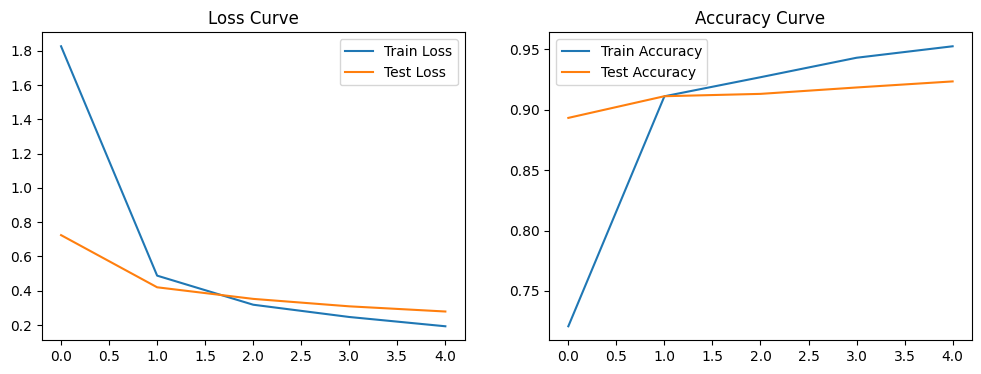

In [55]:
fig,(ax1,ax2) = plt.subplots(1,2,figsize = (12,4))

ax1.set_title("Loss Curve")
ax1.plot(results["train_loss"],label = "Train Loss")
ax1.plot(results["test_loss"],label = "Test Loss")
ax1.legend()

ax2.set_title("Accuracy Curve")
ax2.plot(results["train_acc"],label = "Train Accuracy")
ax2.plot(results["test_acc"],label = "Test Accuracy")
ax2.legend()
plt.show()


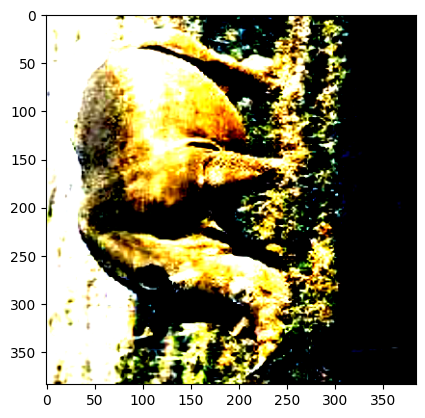

Predicted = rhino,Actual = rhino


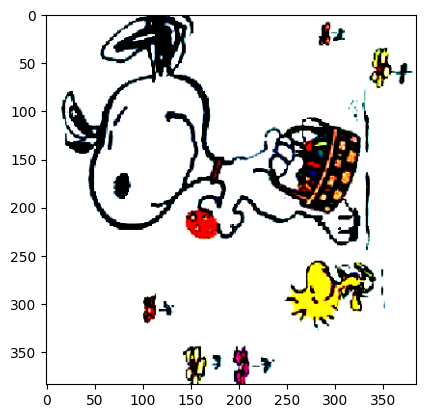

Predicted = snoopy,Actual = snoopy


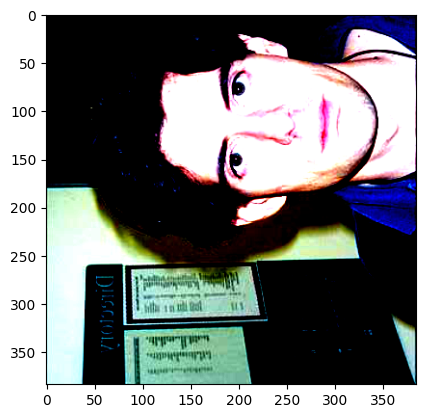

Predicted = Faces,Actual = Faces


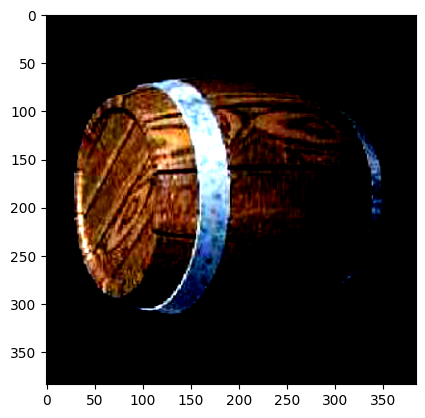

Predicted = barrel,Actual = barrel


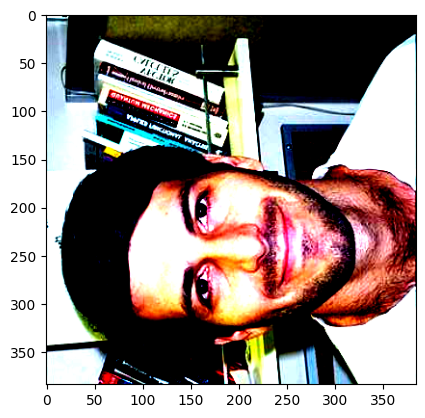

Predicted = Faces,Actual = Faces


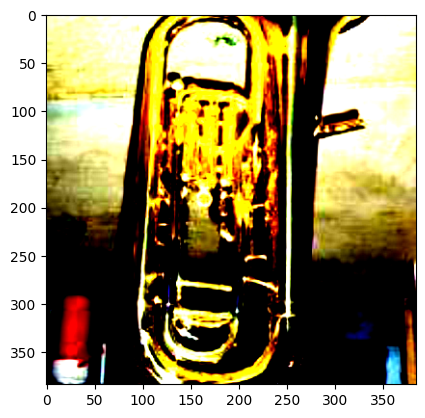

Predicted = euphonium,Actual = euphonium


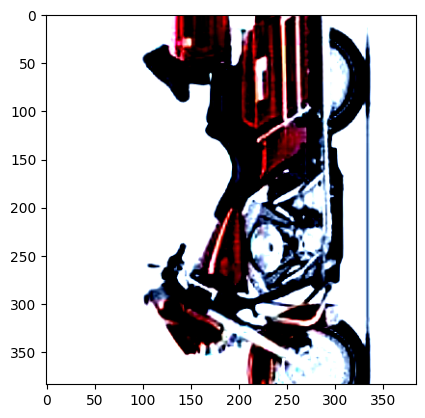

Predicted = Motorbikes,Actual = Motorbikes


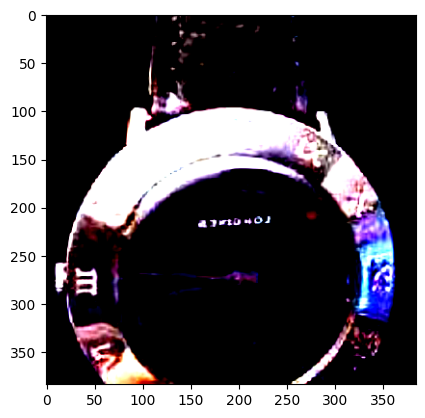

Predicted = barrel,Actual = watch


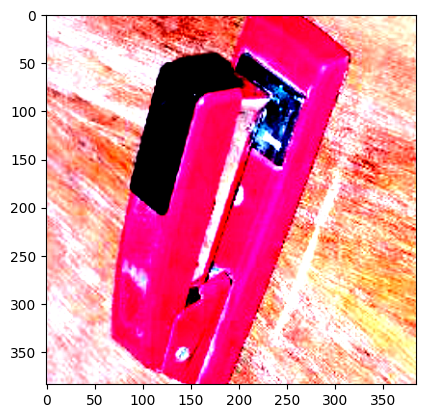

Predicted = stapler,Actual = stapler


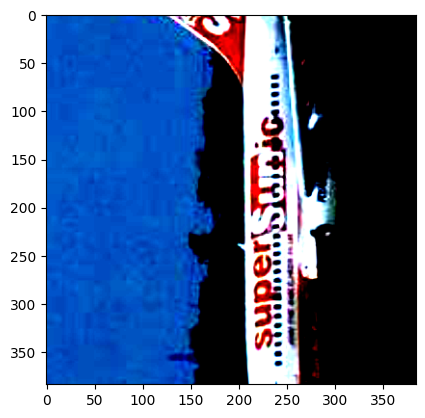

Predicted = airplanes,Actual = airplanes


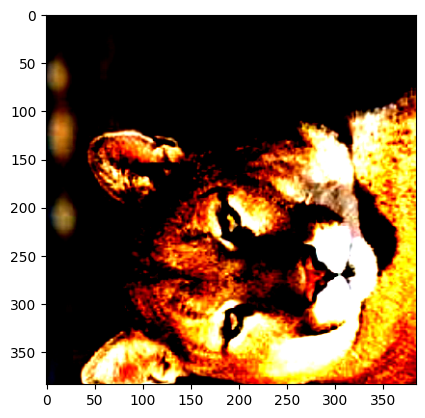

Predicted = cougar_face,Actual = cougar_face


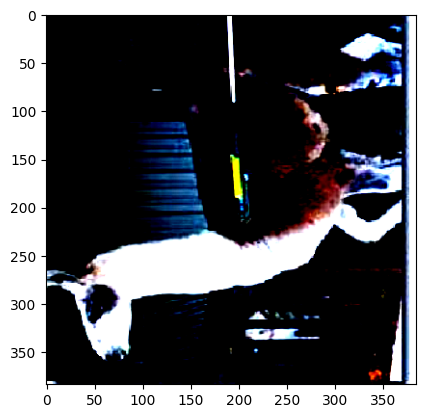

Predicted = llama,Actual = llama


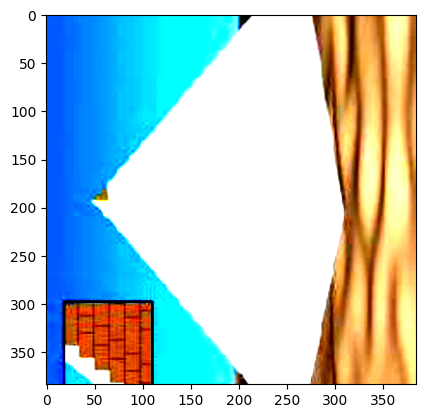

Predicted = pyramid,Actual = pyramid


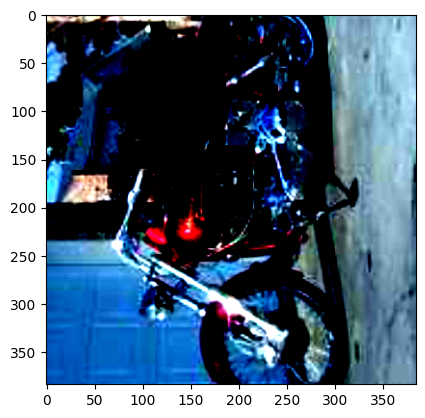

Predicted = Motorbikes,Actual = Motorbikes


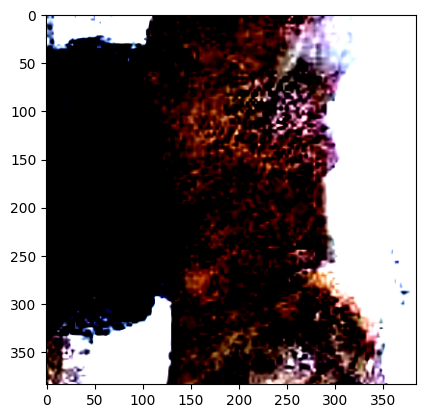

Predicted = cougar_body,Actual = cougar_body


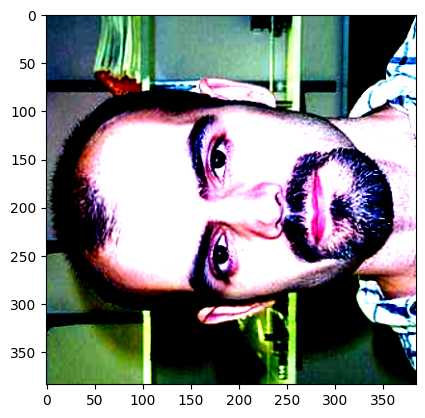

Predicted = Faces_easy,Actual = Faces_easy


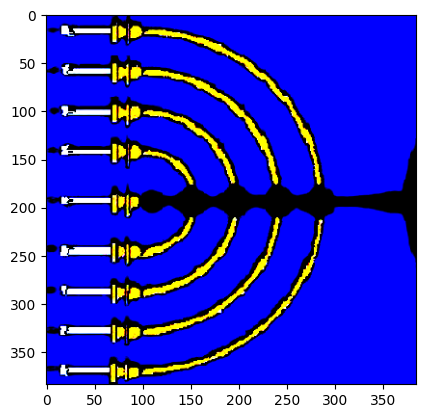

Predicted = menorah,Actual = menorah


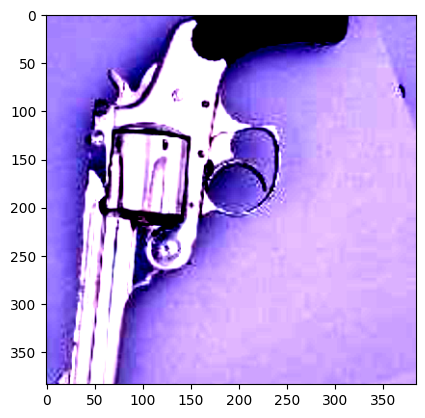

Predicted = revolver,Actual = revolver


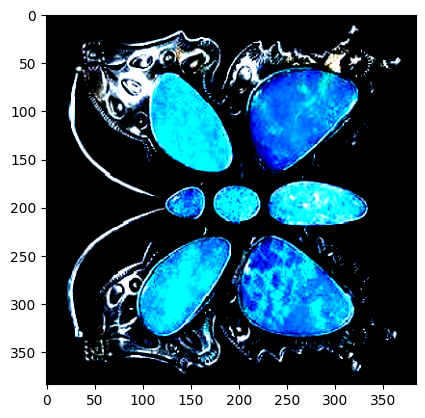

Predicted = scissors,Actual = butterfly


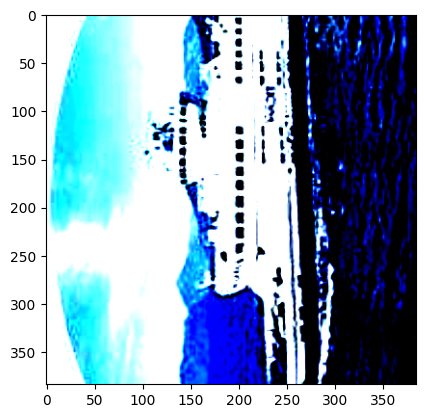

Predicted = ferry,Actual = ferry


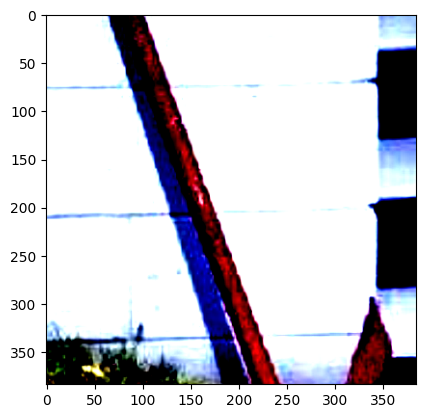

Predicted = bonsai,Actual = anchor


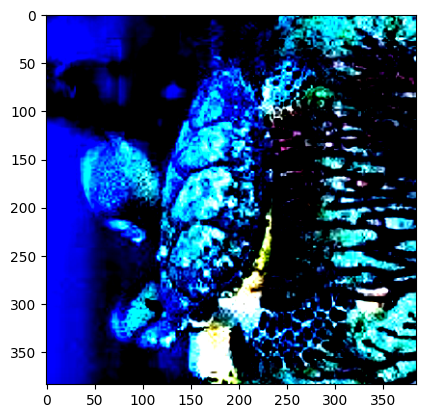

Predicted = hawksbill,Actual = hawksbill


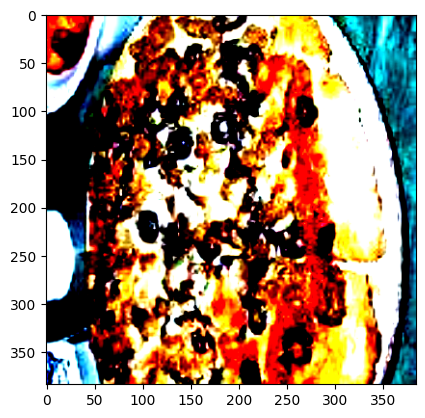

Predicted = pizza,Actual = pizza


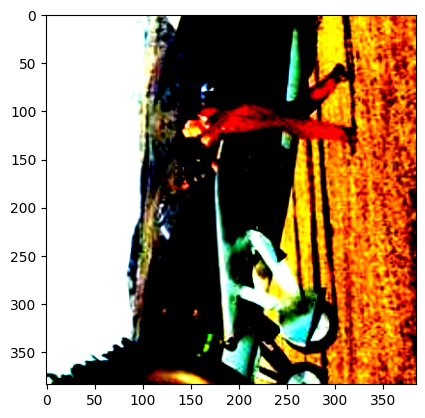

Predicted = airplanes,Actual = airplanes


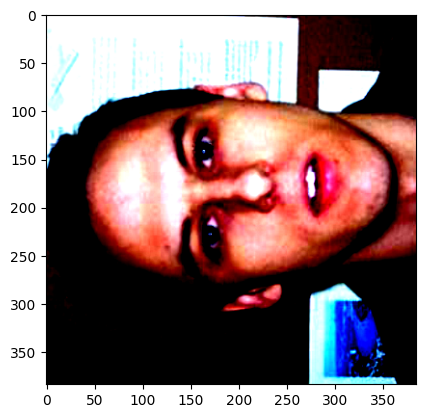

Predicted = Faces_easy,Actual = Faces_easy


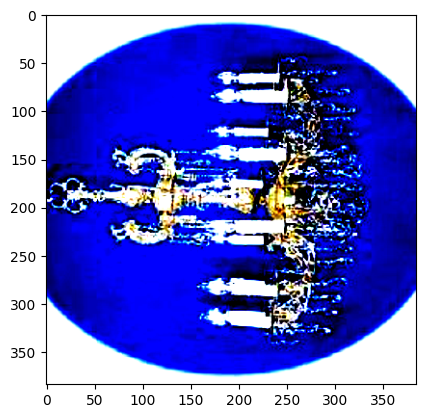

Predicted = chandelier,Actual = chandelier


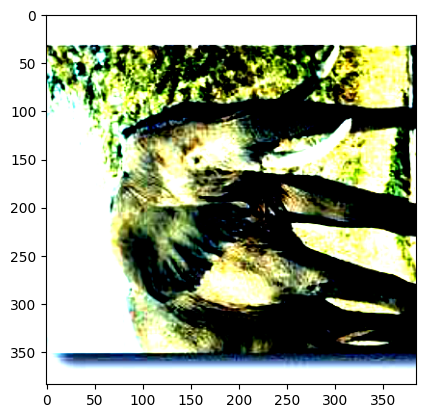

Predicted = elephant,Actual = elephant


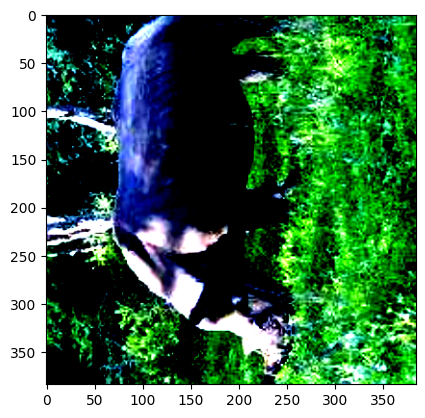

Predicted = rhino,Actual = rhino


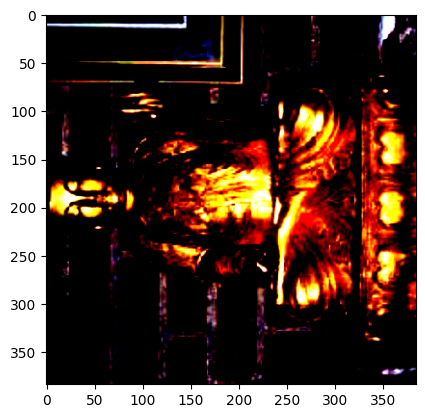

Predicted = buddha,Actual = buddha


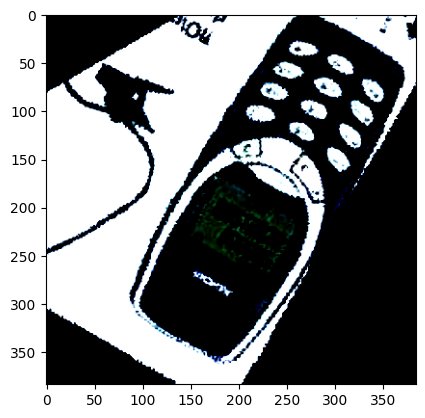

Predicted = cellphone,Actual = cellphone


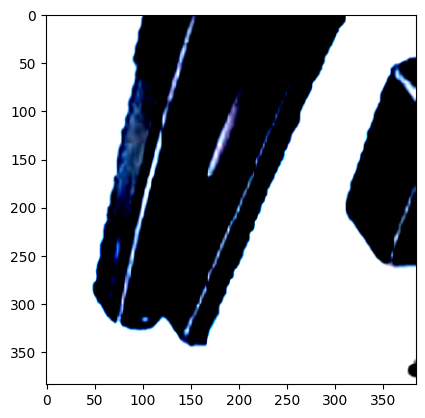

Predicted = stapler,Actual = stapler


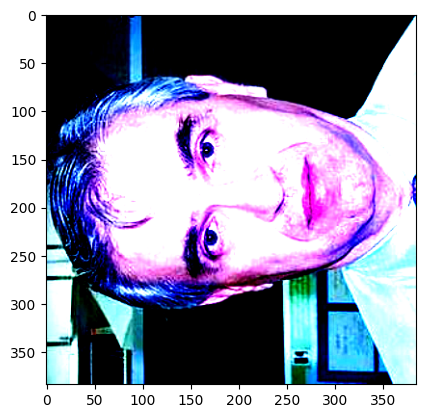

Predicted = Faces_easy,Actual = Faces_easy


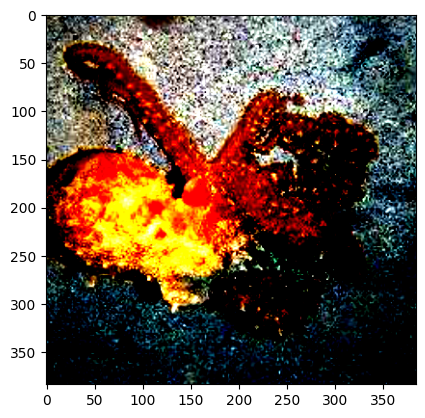

Predicted = sea_horse,Actual = octopus


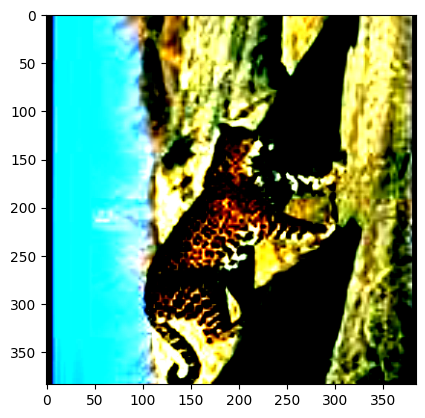

Predicted = Leopards,Actual = Leopards


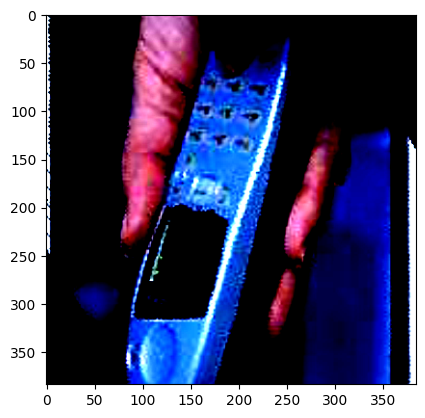

Predicted = cellphone,Actual = cellphone


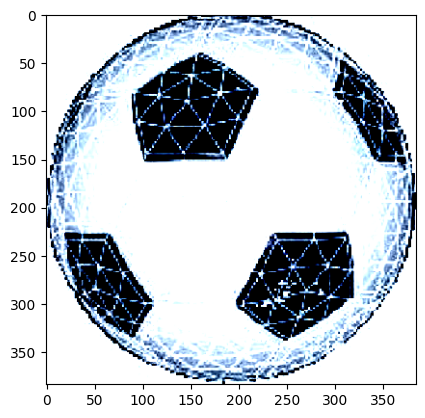

Predicted = soccer_ball,Actual = soccer_ball


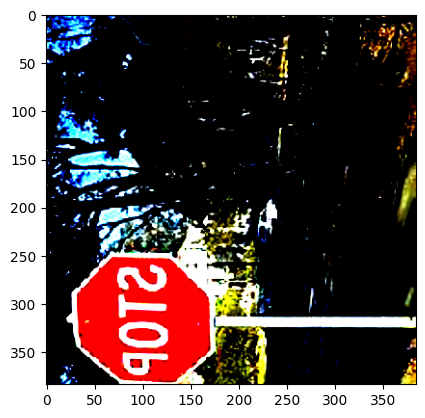

Predicted = stop_sign,Actual = stop_sign


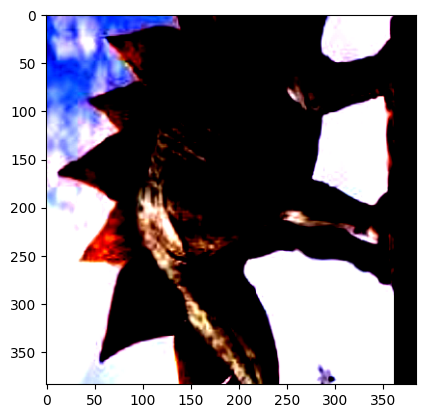

Predicted = stegosaurus,Actual = stegosaurus


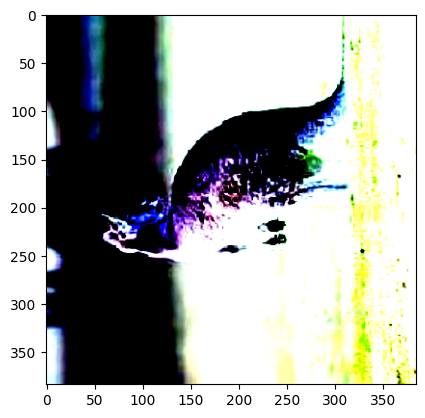

Predicted = kangaroo,Actual = kangaroo


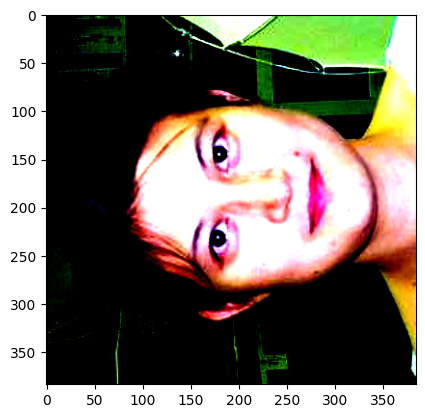

Predicted = Faces_easy,Actual = Faces_easy


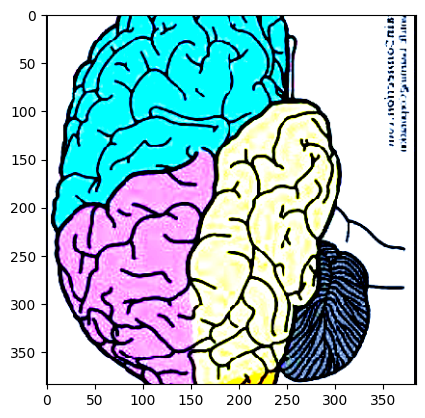

Predicted = brain,Actual = brain


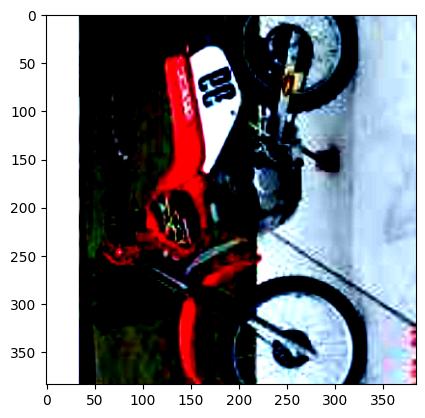

Predicted = Motorbikes,Actual = Motorbikes


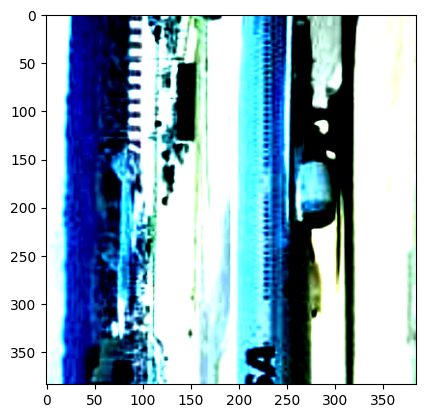

Predicted = airplanes,Actual = airplanes


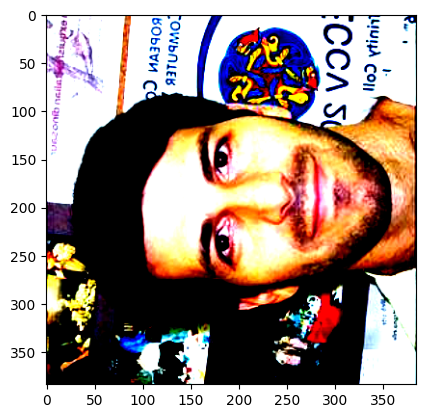

Predicted = Faces_easy,Actual = Faces


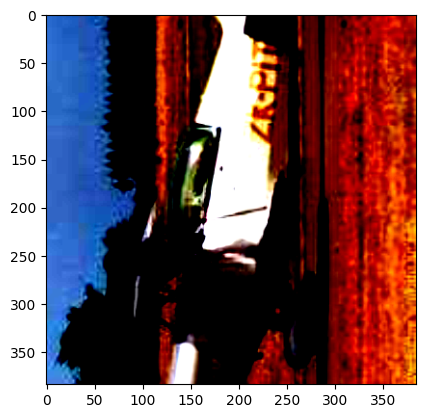

Predicted = airplanes,Actual = airplanes


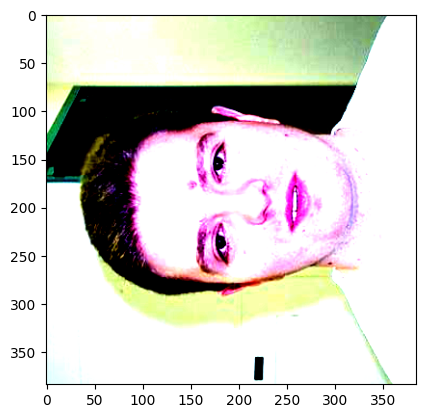

Predicted = Faces,Actual = Faces


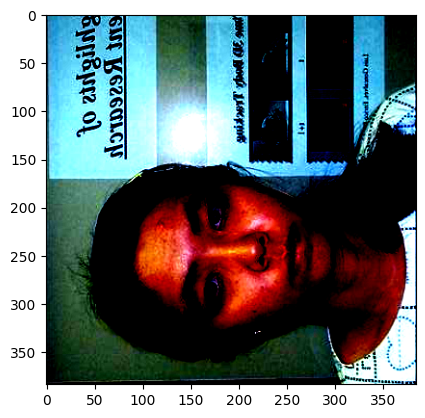

Predicted = Faces,Actual = Faces


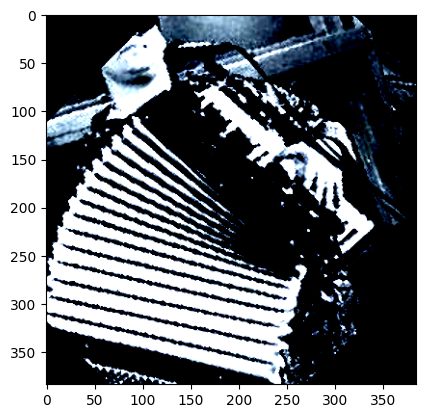

Predicted = accordion,Actual = accordion


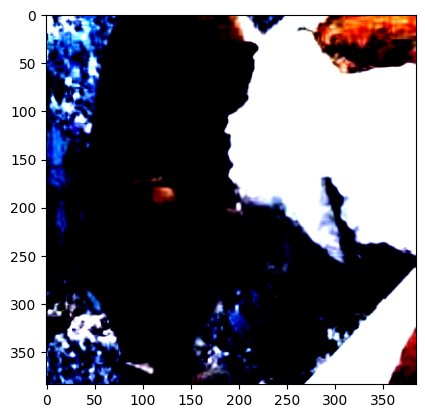

Predicted = cougar_body,Actual = cougar_face


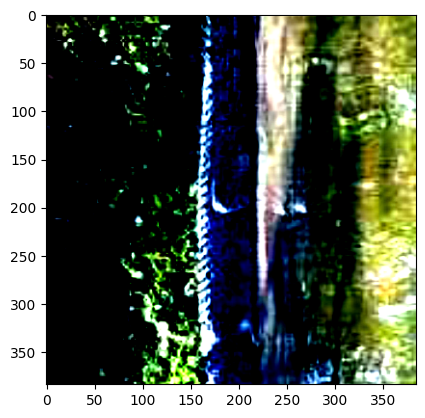

Predicted = crocodile_head,Actual = crocodile


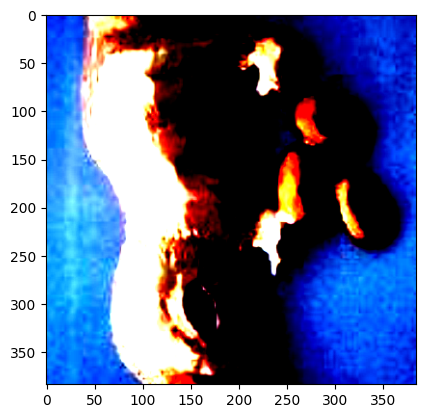

Predicted = platypus,Actual = platypus


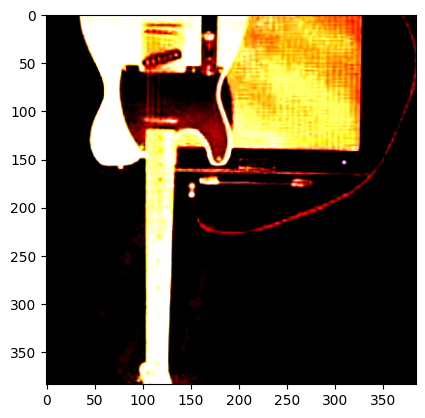

Predicted = electric_guitar,Actual = electric_guitar


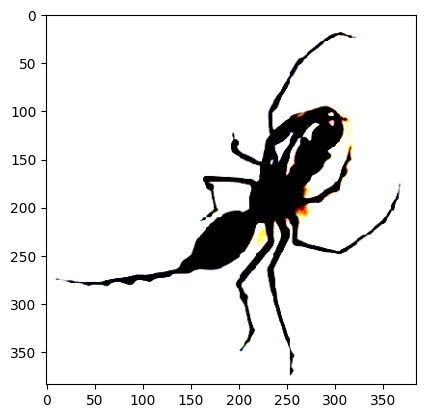

Predicted = ant,Actual = scorpion


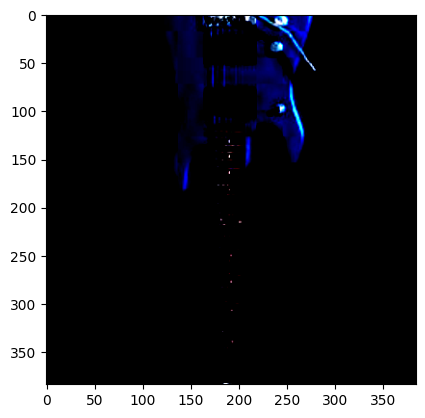

Predicted = electric_guitar,Actual = electric_guitar


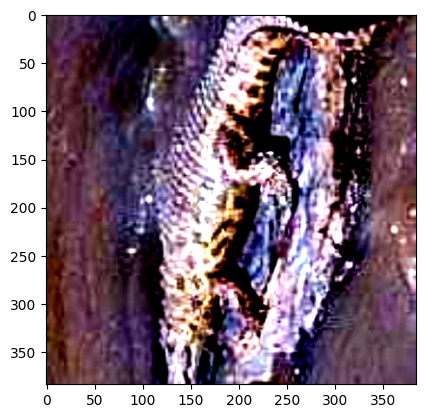

Predicted = crocodile,Actual = crocodile


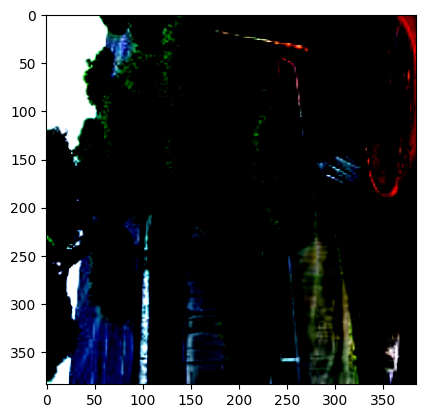

Predicted = bonsai,Actual = bonsai


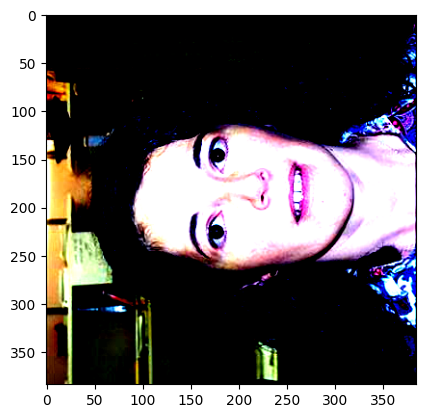

Predicted = Faces,Actual = Faces


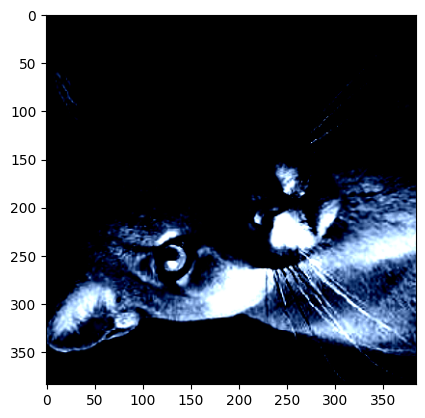

Predicted = cougar_face,Actual = cougar_face


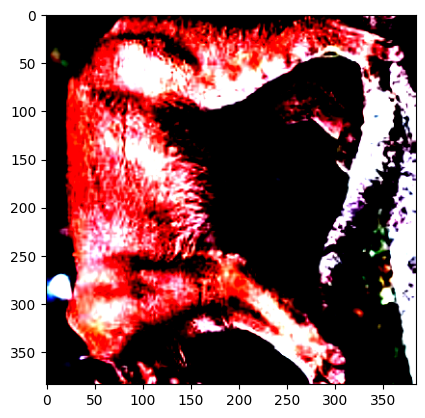

Predicted = cougar_body,Actual = cougar_body


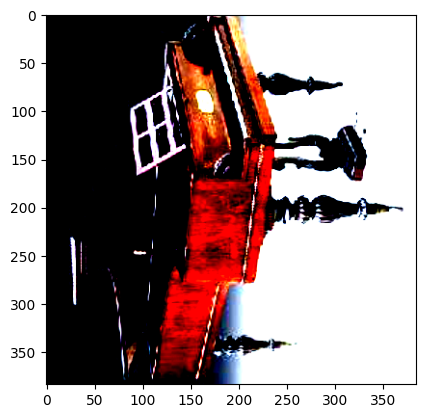

Predicted = grand_piano,Actual = grand_piano


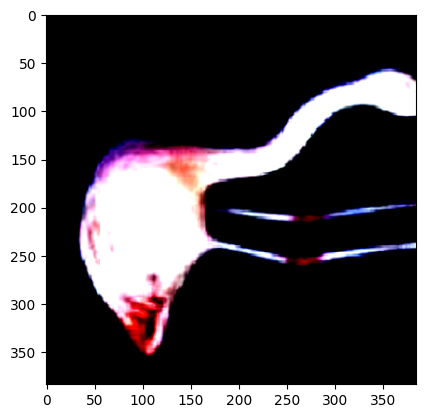

Predicted = flamingo,Actual = flamingo


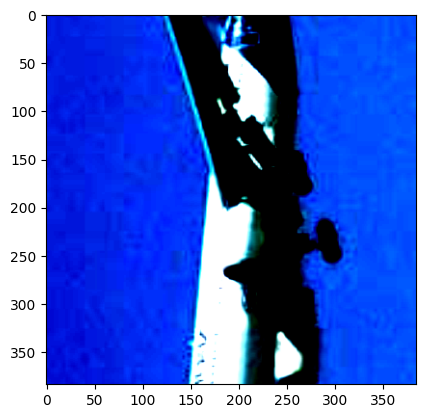

Predicted = airplanes,Actual = airplanes


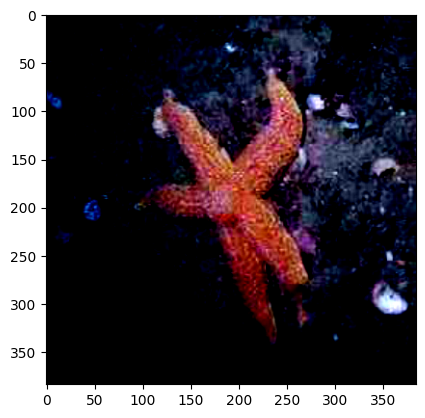

Predicted = starfish,Actual = starfish


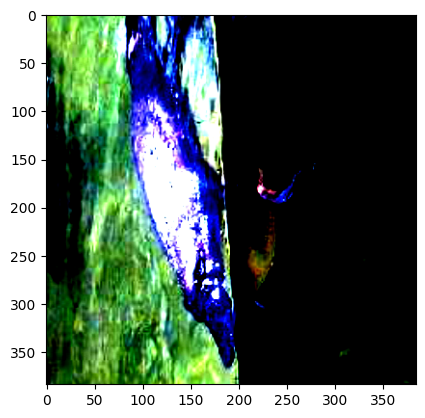

Predicted = platypus,Actual = platypus


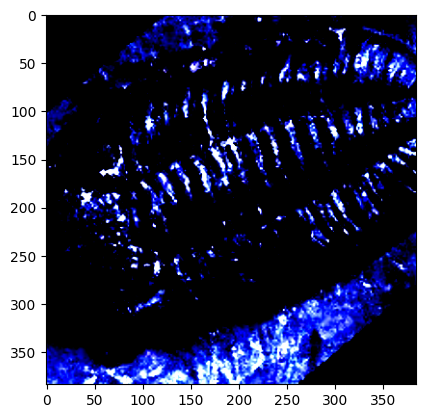

Predicted = trilobite,Actual = trilobite


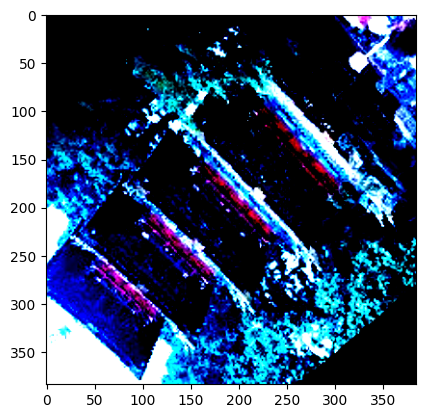

Predicted = pagoda,Actual = pagoda


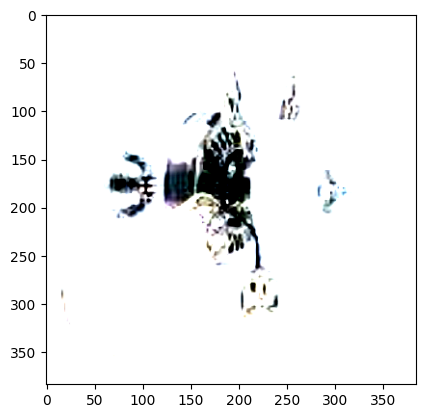

Predicted = ceiling_fan,Actual = ceiling_fan


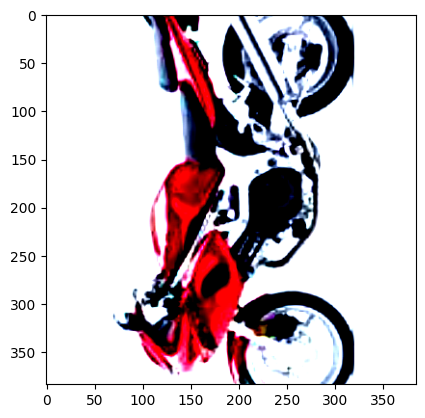

Predicted = Motorbikes,Actual = Motorbikes


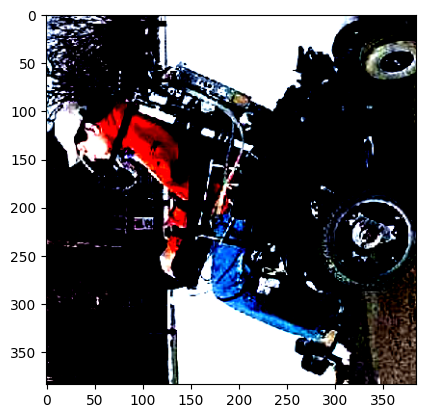

Predicted = wheelchair,Actual = wheelchair


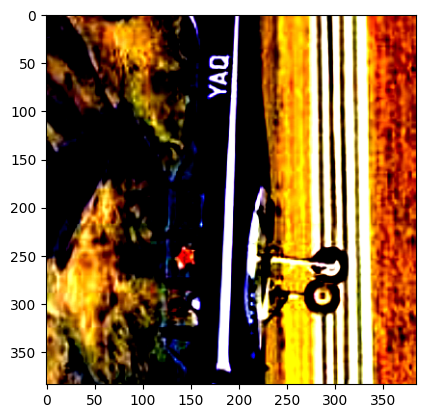

Predicted = airplanes,Actual = airplanes


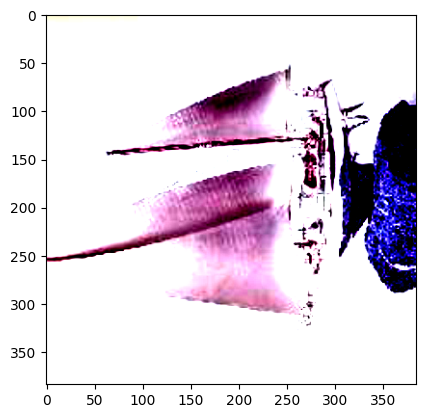

Predicted = ketch,Actual = ketch


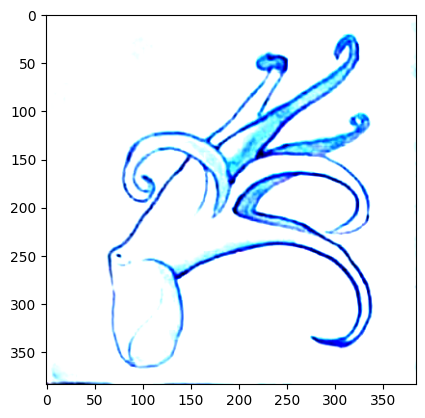

Predicted = octopus,Actual = octopus


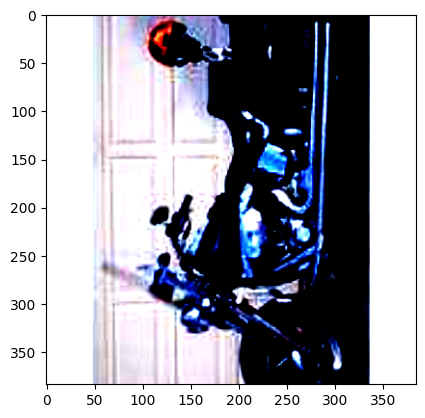

Predicted = Motorbikes,Actual = Motorbikes


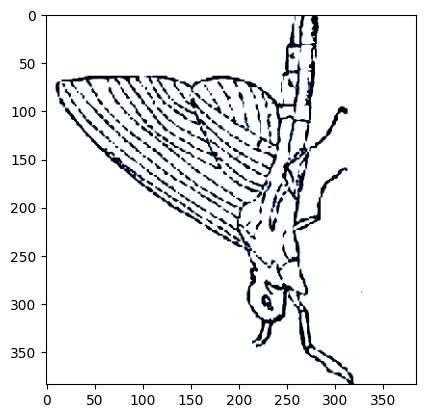

Predicted = mayfly,Actual = mayfly


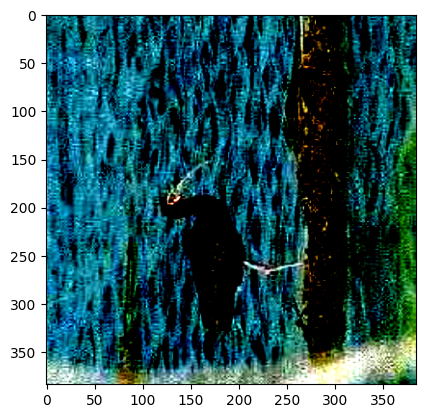

Predicted = ibis,Actual = ibis


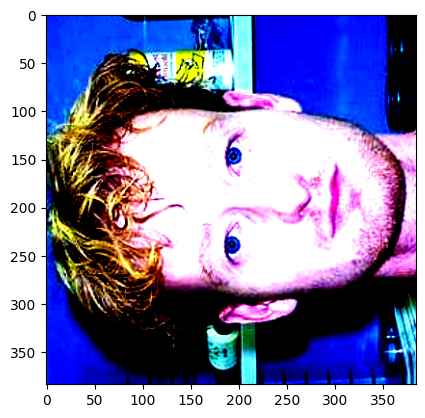

Predicted = Faces_easy,Actual = Faces_easy


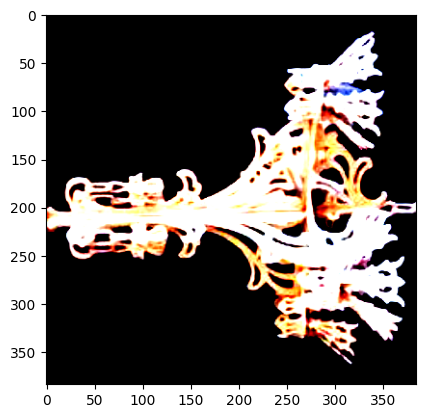

Predicted = chandelier,Actual = chandelier


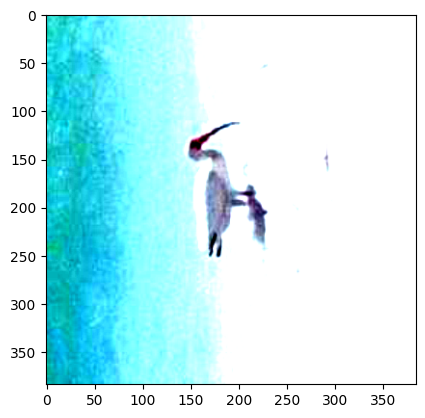

Predicted = ibis,Actual = ibis


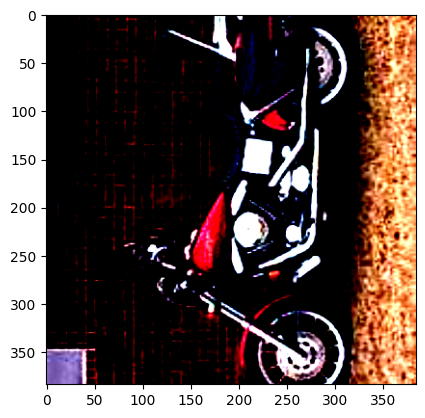

Predicted = Motorbikes,Actual = Motorbikes


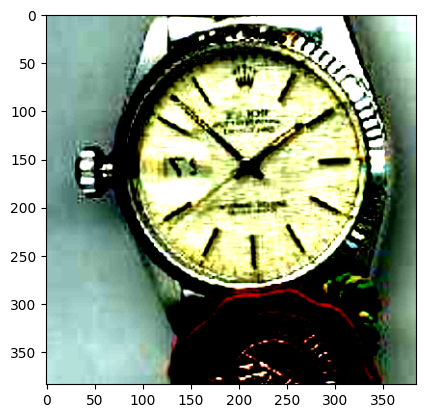

Predicted = watch,Actual = watch


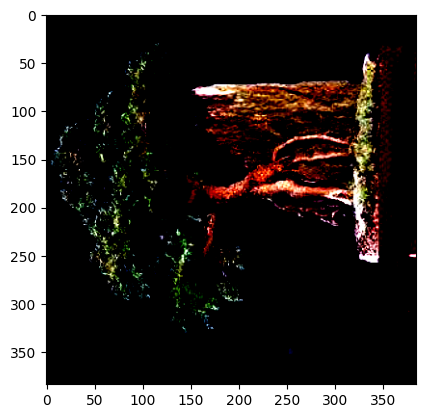

Predicted = bonsai,Actual = bonsai


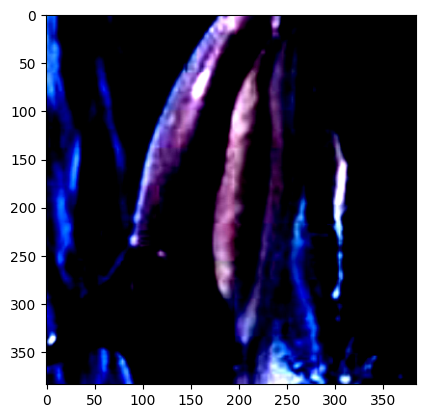

Predicted = dolphin,Actual = dolphin


In [68]:
for idx,(X,y) in enumerate(test_dataloader):
  with torch.no_grad():
    for i,x in enumerate(X):
      plt.imshow(x.T)
      plt.show()
      logit = softmax(model(x.unsqueeze(0).to(device)))
      pred = logit.argmax(dim=1)
      print(f'Predicted = {caltech_cats[pred]},Actual = {caltech_cats[y[i]]}')
      break

In [60]:
len(test_dataloader)

82